# Load libraries

In [1]:
import sys
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
from scipy.sparse import csr_matrix
import logging
import os
import matplotlib.pyplot as plt
import seaborn as sns
import csv
import scipy.stats as stats
import statsmodels.formula.api as smf
import statsmodels.api as sm
import math
import gc
import random
from sklearn.utils import shuffle
import combat2
import combat
import patsy
logging.basicConfig(level=logging.INFO)
savepath = '/wynton/group/ye/richard/flare_final/CLUESImmVarFlare_notebook.h5ad'

# Correct some labeling mistakes and add Broad and gender covariates

In [2]:
################################################
# Adjust nomenclature before combining anndata #
################################################
adata = sc.read('/wynton/group/ye/richard/flare_final/CLUESImmVar_nonorm.V6.h5ad')
del adata.obs['batch']
for key in list(adata.var.keys()):
    del adata.var[key]
print(adata)
# Clinical variates
diseasecovpath = '/wynton/group/ye/richard/flare_final/v2.clinical.data.txt'
clinic_cov = pd.read_csv(diseasecovpath, sep="\t")
# Fix name to make it compatible with clinical variates
adata.obs['ind_cov'] = adata.obs['ind_cov'].astype('object')
adata.obs['ind_cov'][adata.obs['ind_cov'].isin(['1221'])] = '1221_1221'
adata.obs['ind_cov'][adata.obs['ind_cov'].isin(['1251'])] = '1251_1251'
adata.obs['ind_cov'][adata.obs['ind_cov'].isin(['1891'])] = '1891_1891'
indlist = np.unique(np.asarray(adata.obs['ind_cov'].tolist()))
logging.info('Add whether or not sequencing was performed at the Broad Institute as a covariate.')
# Get list of batches
batch_list = adata.obs['batch_cov'].tolist()
# Preallocate int array w/ size of batch_cov
broad = np.zeros_like(np.asarray(batch_list))
# if immvar is in batch name, assign 1.
for ii in range(len(batch_list)):
    if 'immvar' in batch_list[ii]:
        broad[ii] = 1
    else:
        broad[ii] = 0
# Make obs for Broad indication
adata.obs['Broad'] = np.asarray(broad, dtype=np.float32)

logging.info('Add gender as a covariate.')
individuals_list = adata.obs['ind_cov'].tolist()
female = np.zeros_like(np.asarray(individuals_list))
for ii in range(len(individuals_list)):
    if 'IGT' in individuals_list[ii]:
        female[ii] = 1
    else:
        if clinic_cov['female'][clinic_cov['genotypeid'].isin([individuals_list[ii]])].values.tolist()[0] == 1:
            female[ii] = 1
        else:
            female[ii] = 0
# Make obs for Broad indication
adata.obs['Female'] = np.asarray(female, dtype=np.float32)
adata.obs['disease_cov'] = adata.obs.disease_cov.astype('object')
adata.obs['disease_cov'][adata.obs['disease_cov']=='sle'] = 'Managed'
adata.obs['disease_cov'][adata.obs['disease_cov']=='healthy'] = 'Healthy'

logging.info('Removing samples that were processed twice...')
# Remove samples that were processed twice and get rid of their 1.10 run
remove = ['902289200_902289200', '1262_1262', '1270_1270', '1279_1279']
# Remove samples that were processed twice and get rid of their 8.9 run
# since the 8.9 run has the fewest number of cells, this adjustment is important for testing for cell proportion differences
# going forward, we will want to combine batches for the same individuals
remove2 = ['1472_1472', '1479_1479', '1480_1480', '1492_1492', '1522_1522', '1535_1535', '1602_1602', '1615_1615', '1621_1621', '1716_1716', '1726_1726', '1730_1730']
keep_indices = ~((adata.obs.ind_cov.isin(remove)) & (adata.obs.batch_cov == "lupus1.10"))
keep2_indices = ~((adata.obs.ind_cov.isin(remove2)) & (adata.obs.batch_cov == "lupus8.9"))
adata = adata[(keep_indices & keep2_indices)]
print(adata)

# Combine Cross-sectional data with flare data
bdata = sc.read('/wynton/group/ye/richard/flare_final/FlareClean.h5ad')
print(bdata)
# Concatenate files.
adata = adata.concatenate(bdata)
print(adata)
adata.write(savepath, compression="gzip")

AnnData object with n_obs × n_vars = 834096 × 32738 
    obs: 'disease_cov', 'ct_cov', 'pop_cov', 'ind_cov', 'well', 'batch_cov'


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()
INFO:root:Add

View of AnnData object with n_obs × n_vars = 789224 × 32738 
    obs: 'disease_cov', 'ct_cov', 'pop_cov', 'ind_cov', 'well', 'batch_cov', 'Broad', 'Female'
AnnData object with n_obs × n_vars = 156903 × 32738 
    obs: 'SOURCE', 'batch_cov', 'ind_cov', 'well', 'Female', 'pop_cov', 'Broad', 'CD38|CD38|j95-01|pAbO', 'CD95|FAS|j95-02|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD196|CCR6|j95-17|pAbO', 'HLA-DR|CD74|j95-18|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD127|IL7R|j95-27|pAbO', 'CD45RA|PTPRC|j95-28|pAbO', 'disease_cov'
AnnData object with n_obs × n_vars = 946127 × 32738 
    obs: 'Broad', 'CD127|IL7R|j95-27|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD185

... storing 'SOURCE' as categorical
... storing 'batch_cov' as categorical
... storing 'ct_cov' as categorical
... storing 'disease_cov' as categorical
... storing 'ind_cov' as categorical
... storing 'pop_cov' as categorical
... storing 'well' as categorical


# Basic filtering

In [3]:
####################
# Basic processing #
####################
adata.obs['well'] = adata.obs['well'].astype('category')
adata.var_names_make_unique()
logging.info(str('Data structure details: ' + str(adata)))
#logging.info('Removing Erythrocytes.')
#mat = csr_matrix(adata.X)
#mat = mat[:, adata.var_names.isin(['HBB'])].todense()
#adata = adata[np.ravel(mat <= 1)]
#logging.info(str('Data structure details: ' + str(adata)))
# Extract list of genes
genelist = adata.var_names.tolist()
# Find mitochondrial genes
mito_genes_names = [gn for gn in genelist if gn.startswith('MT-')]
logging.info(str('Mito genes: ' + str(mito_genes_names)))
# Find indices of mitochondrial genes
mito_genes = [genelist.index(gn) for gn in mito_genes_names]
# For each cell compute fraction of counts in mito genes vs. all genes
adata.obs['percent_mito'] = np.ravel(np.sum(adata[:, mito_genes].X, axis=1)) / np.ravel(np.sum(adata.X, axis=1))
# Add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = np.ravel(adata.X.sum(axis=1))
logging.info('Filtering cells')
# Filter cells that have more than 10% of counts coming from mitochondrial genes.
adata = adata[adata.obs['percent_mito'] < 0.10]
logging.info(str('Data structure details: ' + str(adata)))
# Filter cells with abnormally low gene counts, high gene counts.
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_cells(adata, max_genes=2500)
sc.pp.filter_genes(adata, min_cells=200)
logging.info(str('Data structure details: ' + str(adata)))
logging.info('Saving raw counts')
adata.uns['barcodes'] = adata.obs_names.tolist()
adata.uns['genes'] = adata.var_names.tolist()
adata.uns['raw_counts'] = adata.X
logging.info('Normalizing total counts to 10,000')
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
logging.info('Log transforming data')
sc.pp.log1p(adata)
logging.info('Saving log(counts)+1 in .raw')
adata.raw = adata
logging.info(str('Data structure details: ' + str(adata)))
logging.info('Filtering genes')
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata = adata[:, adata.var['highly_variable']]
logging.info(str('Data structure details: ' + str(adata)))

INFO:root:Data structure details: AnnData object with n_obs × n_vars = 946127 × 32738 
    obs: 'Broad', 'CD127|IL7R|j95-27|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD196|CCR6|j95-17|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD38|CD38|j95-01|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD45RA|PTPRC|j95-28|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD95|FAS|j95-02|pAbO', 'Female', 'HLA-DR|CD74|j95-18|pAbO', 'SOURCE', 'batch', 'batch_cov', 'ct_cov', 'disease_cov', 'ind_cov', 'pop_cov', 'well'
INFO:root:Mito genes: ['MT-ND1', 'MT-ND2', 'MT-CO1', 'MT-CO2', 'MT-ATP8', 'MT-ATP6', 'MT-CO3', 'MT-ND3', 'MT-ND4L', 'MT-ND4', 'MT-ND5', 'MT-ND6', 'MT-CYB']
INFO:root:Filtering cells
INFO:root:Data structure details: View of AnnData object with n_obs × n_vars = 933755 × 32738 
    obs:

# Combat batch correction

In [32]:
logging.info('Running combat')
mod = patsy.dmatrix("~ disease_cov", adata.obs, return_type="dataframe")
mod = mod.reset_index(drop=True)
batch = adata.obs['batch_cov']
batch = batch.reset_index(drop=True)

INFO:root:Running combat


In [36]:
adata.X = combat.combat(adata.X.transpose().toarray(), batch=batch, model=mod).transpose()

found 18 batches
found 0 numerical covariates...
found 3 categorical variables:	disease_cov[T.Healthy], disease_cov[T.Managed], disease_cov[T.Treated]
Standardizing Data across genes.
Fitting L/S model and finding priors
Finding parametric adjustments


Adjusting data


# Regress platelet signature

In [38]:
# Add platelet genes for purposes of regressing out their signature
adata.obs['PF4'] = adata.raw[:,"PF4"].X
adata.obs['SDPR'] = adata.raw[:,"SDPR"].X
adata.obs['GNG11'] = adata.raw[:,"GNG11"].X
adata.obs['PPBP'] = adata.raw[:,"PPBP"].X
logging.info('Making .obs into categories')
adata.strings_to_categoricals()
logging.info(str('Data structure details: ' + str(adata)))
sc.pp.scale(adata, max_value=10)

INFO:root:Making .obs into categories
INFO:root:Data structure details: AnnData object with n_obs × n_vars = 931108 × 1284 
    obs: 'Broad', 'CD127|IL7R|j95-27|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD196|CCR6|j95-17|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD38|CD38|j95-01|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD45RA|PTPRC|j95-28|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD95|FAS|j95-02|pAbO', 'Female', 'HLA-DR|CD74|j95-18|pAbO', 'SOURCE', 'batch', 'batch_cov', 'ct_cov', 'disease_cov', 'ind_cov', 'pop_cov', 'well', 'percent_mito', 'n_counts', 'n_genes', 'PF4', 'SDPR', 'GNG11', 'PPBP'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'barcodes', 'genes', 'raw_counts'


In [41]:
## compute PCA
sc.pp.pca(adata, random_state=1, svd_solver='arpack')

## removing the two components most highly correlated with platelet counts
to_remove = pd.Series()
for ii in range(len(adata.obsm.X_pca[1,:])) :
    logging.info(str(np.corrcoef(adata.obsm.X_pca[:,ii], adata.obs["PF4"])[0,1]))
    if(np.absolute(np.corrcoef(adata.obsm.X_pca[:,ii], adata.obs["PF4"])[0,1]) > 0.1):
        adata.obs["PC"+str(ii)] = adata.obsm.X_pca[:,ii];
        to_remove = to_remove.append(pd.Series(["PC"+str(ii)]))
        logging.info(str(ii))
        logging.info(str(np.corrcoef(adata.obsm.X_pca[:,ii], adata.obs["PF4"])))

regressors = ['n_counts', 'percent_mito', 'Female']+to_remove.tolist();

logging.info('Regressing out total nUMIs, percentage mitochondrial UMIs, gender, platelet signature and pool')
logging.info('regressors: '+str(regressors))

INFO:root:0.02002823651964731
INFO:root:-0.035572167364698655
INFO:root:0.21397062807250725
INFO:root:2
INFO:root:[[1.         0.21397063]
 [0.21397063 1.        ]]
INFO:root:0.5501497114384237
INFO:root:3
INFO:root:[[1.         0.55014971]
 [0.55014971 1.        ]]
INFO:root:-0.018102449559034048
INFO:root:-0.06539730732508295
INFO:root:-0.005754357683258993
INFO:root:-0.003173411628123679
INFO:root:-0.039125652516651795
INFO:root:0.01605368493685791
INFO:root:-0.06796021377997374
INFO:root:-0.18488045410673914
INFO:root:11
INFO:root:[[ 1.         -0.18488045]
 [-0.18488045  1.        ]]
INFO:root:-0.13774079591959779
INFO:root:12
INFO:root:[[ 1.        -0.1377408]
 [-0.1377408  1.       ]]
INFO:root:-0.03572685777567929
INFO:root:0.04406072593648782
INFO:root:-0.010485858221818856
INFO:root:0.0015072057668822252
INFO:root:-0.016806481784061474
INFO:root:0.03720844358156271
INFO:root:0.008817232107358417
INFO:root:-0.013135225637071575
INFO:root:0.020515026813309765
INFO:root:0.019534

In [42]:
sc.pp.regress_out(adata, regressors)
logging.info('Scaling expression data')
sc.pp.scale(adata, max_value=10)
logging.info(str('Data structure details: ' + str(adata)))

INFO:root:Scaling expression data
INFO:root:Data structure details: AnnData object with n_obs × n_vars = 931108 × 1284 
    obs: 'Broad', 'CD127|IL7R|j95-27|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD196|CCR6|j95-17|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD38|CD38|j95-01|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD45RA|PTPRC|j95-28|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD95|FAS|j95-02|pAbO', 'Female', 'HLA-DR|CD74|j95-18|pAbO', 'SOURCE', 'batch', 'batch_cov', 'ct_cov', 'disease_cov', 'ind_cov', 'pop_cov', 'well', 'percent_mito', 'n_counts', 'n_genes', 'PF4', 'SDPR', 'GNG11', 'PPBP', 'PC2', 'PC3', 'PC11', 'PC12', 'PC26'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'barcodes', 'genes', 'raw_counts', 'pca'
    obsm: '

# Note total number of cells per individual

In [43]:
# Unique list of individuals
people = np.unique(adata.obs['ind_cov'].values.tolist())
# Allocate space for total PMBCs per individual.
total_pbmcs = dict.fromkeys(people)
for p in people:
    total_pbmcs[p] = len(adata.obs_names[adata.obs['ind_cov'] == p])
adata.uns['total_pbmcs'] = total_pbmcs

# Save file

In [45]:
logging.info('Saving processed data')
logging.info(str('Structure details: ' + str(adata)))
adata.write(savepath, compression="gzip")

INFO:root:Saving processed data
INFO:root:Structure details: AnnData object with n_obs × n_vars = 931108 × 1284 
    obs: 'Broad', 'CD127|IL7R|j95-27|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD196|CCR6|j95-17|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD38|CD38|j95-01|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD45RA|PTPRC|j95-28|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD95|FAS|j95-02|pAbO', 'Female', 'HLA-DR|CD74|j95-18|pAbO', 'SOURCE', 'batch', 'batch_cov', 'ct_cov', 'disease_cov', 'ind_cov', 'pop_cov', 'well', 'percent_mito', 'n_counts', 'n_genes', 'PF4', 'SDPR', 'GNG11', 'PPBP', 'PC2', 'PC3', 'PC11', 'PC12', 'PC26'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'barcodes', 'genes', 'raw_counts', 'pca', 'total_pbmcs'
   

# Projections and clustering

In [46]:
#######################
# Leiden and friends #
#######################
# Set parameters
intialization = 1
n_components = 20
resolution = 3
# Run leiden clustering on theoretical future gene expression per cell
logging.info('Estimating leiden cluster identities for gene expression values.')
sc.pp.pca(adata, random_state=intialization, svd_solver='arpack')
logging.info('PCA complete.')
sc.pp.neighbors(adata, random_state=intialization)
logging.info('KNN complete.')
sc.tl.diffmap(adata)
logging.info('diffmap complete.')
#sc.tl.louvain(adata, random_state=intialization, resolution=resolution)
sc.tl.leiden(adata, random_state=intialization, resolution=resolution)
logging.info('leiden complete.')
sc.tl.umap(adata, random_state=intialization)
logging.info('UMAP complete.')
logging.info('Making .obs into categories')
adata.strings_to_categoricals()
adata.write(savepath, compression="gzip")
logging.info('Basic analysis complete.')

INFO:root:Estimating louvain cluster identities for gene expression values.
INFO:root:PCA complete.
INFO:root:KNN complete.
INFO:root:diffmap complete.
INFO:root:Louvain complete.
INFO:root:UMAP complete.
INFO:root:Making .obs into categories
INFO:root:Basic analysis complete.


# Read data

In [2]:
%matplotlib inline
##################
# Configure file #
##################
sc.settings.verbosity = 2
sc.settings.autoshow = False
sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=16)
plt.rcParams["image.aspect"] = "equal"
adata = sc.read(savepath, cache=True)
print(adata)
figdir = "./figures."
sc.settings.figdir = "./figures."
MASTERCOLORS = sc.pl.palettes.default_64
MASTERCOLORS.remove("#FEFFE6")
MASTERCOLORS.remove("#FFFF00")

AnnData object with n_obs × n_vars = 931108 × 1284 
    obs: 'Broad', 'CD127|IL7R|j95-27|pAbO', 'CD14|CD14|j95-20|pAbO', 'CD161|KLRB1|j95-11|pAbO', 'CD183|CXCR3|j95-12|pAbO', 'CD185|CXCR5|j95-22|pAbO', 'CD194|CCR4|j95-21|pAbO', 'CD196|CCR6|j95-17|pAbO', 'CD197|CCR7|j95-09|pAbO', 'CD19|CD19|j95-10|pAbO', 'CD25|IL2RA|j95-24|pAbO', 'CD27|CD27|j95-08|pAbO', 'CD28|CD28|j95-07|pAbO', 'CD38|CD38|j95-01|pAbO', 'CD3|CD3E|j95-16|pAbO', 'CD45RA|PTPRC|j95-28|pAbO', 'CD45RO|PTPRC|j95-19|pAbO', 'CD4|CD4|j95-14|pAbO', 'CD8|CD8A|j95-25|pAbO', 'CD95|FAS|j95-02|pAbO', 'Female', 'HLA-DR|CD74|j95-18|pAbO', 'SOURCE', 'batch', 'batch_cov', 'ct_cov', 'disease_cov', 'ind_cov', 'pop_cov', 'well', 'percent_mito', 'n_counts', 'n_genes', 'PF4', 'SDPR', 'GNG11', 'PPBP', 'PC2', 'PC3', 'PC11', 'PC12', 'PC26', 'leiden'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'barcodes', 'diffmap_evals', 'genes', 'leiden', 'neighbors', 'pca', 'raw_counts', 'total_pbmcs'
    obsm: 'X_p

# Sort adata in a consistent way

In [3]:
adata_obs_sorted = adata.obs.sort_values(by=['disease_cov','ind_cov','batch_cov'], ascending=False);
adata = adata[adata_obs_sorted.index]
adata.obs['site'] = pd.Categorical(adata.obs.disease_cov, categories=['Broad','UCSF'])
adata.obs.site[adata.obs.batch_cov.str.contains("IMMVAR")] = "Broad"
adata.obs.site[~adata.obs.batch_cov.str.contains("IMMVAR")] = "UCSF"
adata.obs['disease_pop_site_cov'] = pd.Categorical(adata.obs.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1), ordered=True)
# Sorting proportions by healthy versus treated versus untreated.
adata.obs['ind_cov_disease_cov'] = pd.Categorical(adata.obs.apply(lambda row: row['ind_cov']+ row['disease_cov'], axis=1), ordered=True)
adata.obs.to_csv('adata.obs.txt')

## Create useful function

In [4]:
def marker_gene_expression(anndata, marker_dict, gene_symbol_key=None, partition_key='louvain_r1'):
   """A function go get mean z-score expressions of marker genes
   #
   # Inputs:
   #    anndata         - An AnnData object containing the data set and a partition
   #    marker_dict     - A dictionary with cell-type markers. The markers should be stores as anndata.var_names or
   #                      an anndata.var field with the key given by the gene_symbol_key input
   #    gene_symbol_key - The key for the anndata.var field with gene IDs or names that correspond to the marker
   #                      genes
   #    partition_key   - The key for the anndata.obs field where the cluster IDs are stored. The default is
   #                      'louvain_r1' """

   # Test inputs
   if partition_key not in anndata.obs.columns.values:
       print('KeyError: The partition key was not found in the passed AnnData object.')
       print('   Have you done the clustering? If so, please pass the cluster IDs with the AnnData object!')
       raise

   if (gene_symbol_key != None) and (gene_symbol_key not in anndata.var.columns.values):
       print('KeyError: The provided gene symbol key was not found in the passed AnnData object.')
       print('   Check that your cell type markers are given in a format that your anndata object knows!')
       raise

   if gene_symbol_key:
       gene_ids = anndata.var[gene_symbol_key]
   else:
       gene_ids = anndata.var_names

   clusters = anndata.obs[partition_key].cat.categories
   n_clust = len(clusters)
   marker_exp = pd.DataFrame(columns=clusters)
   marker_exp['cell_type'] = pd.Series({}, dtype='str')
   marker_names = []

   z_scores = sc.pp.scale(anndata, copy=True)

   i = 0
   for group in marker_dict:
       # Find the corresponding columns and get their mean expression in the cluster
       for gene in marker_dict[group]:
           ens_idx = np.in1d(gene_ids, gene) #Note there may be multiple mappings
           if np.sum(ens_idx) == 0:
               continue
           else:
               z_scores.obs[ens_idx[0]] = z_scores.X[:,ens_idx].mean(1) #works for both single and multiple mapping
               ens_idx = ens_idx[0]

           clust_marker_exp = z_scores.obs.groupby(partition_key)[ens_idx].apply(np.mean).tolist()
           clust_marker_exp.append(group)
           marker_exp.loc[i] = clust_marker_exp
           marker_names.append(gene)
           i+=1

   # Replace the rownames with informative gene symbols
   marker_exp.index = marker_names

   return(marker_exp)

marker_dictionary = pd.DataFrame({"all": adata.var_names})

# Figure 6A: Projection and dropprint

saving figure to file ./figures./umap.disease_pop.png


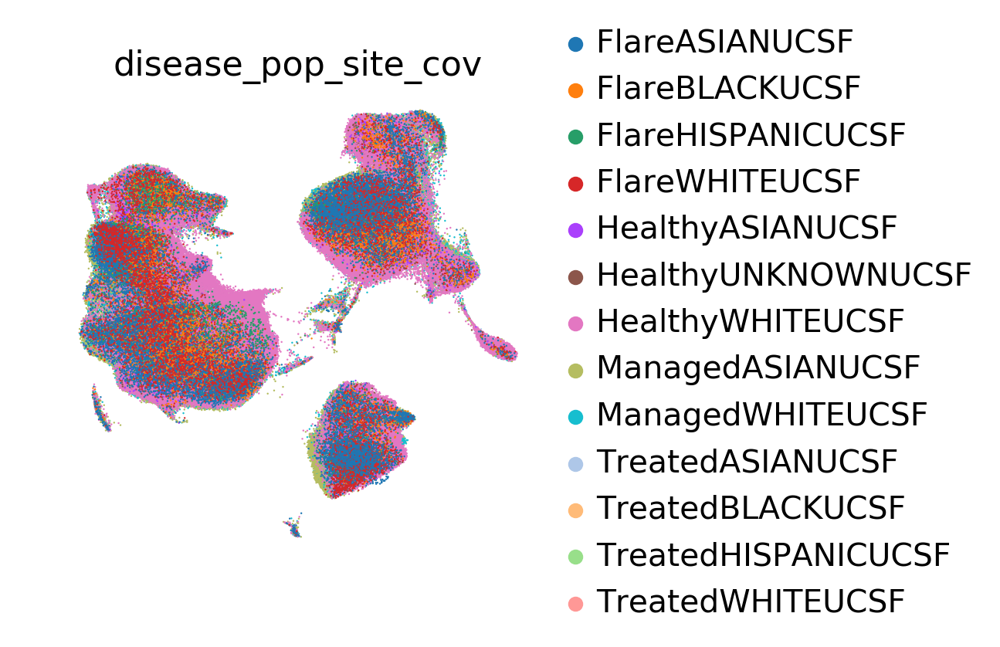

In [53]:
sc.pl.umap(adata, size=3, color="disease_pop_site_cov", edgecolor="none", show=True, save='.disease_pop.png', palette=sc.pl.palettes.vega_20_scanpy)

saving figure to file ./figures./umap.disease.png


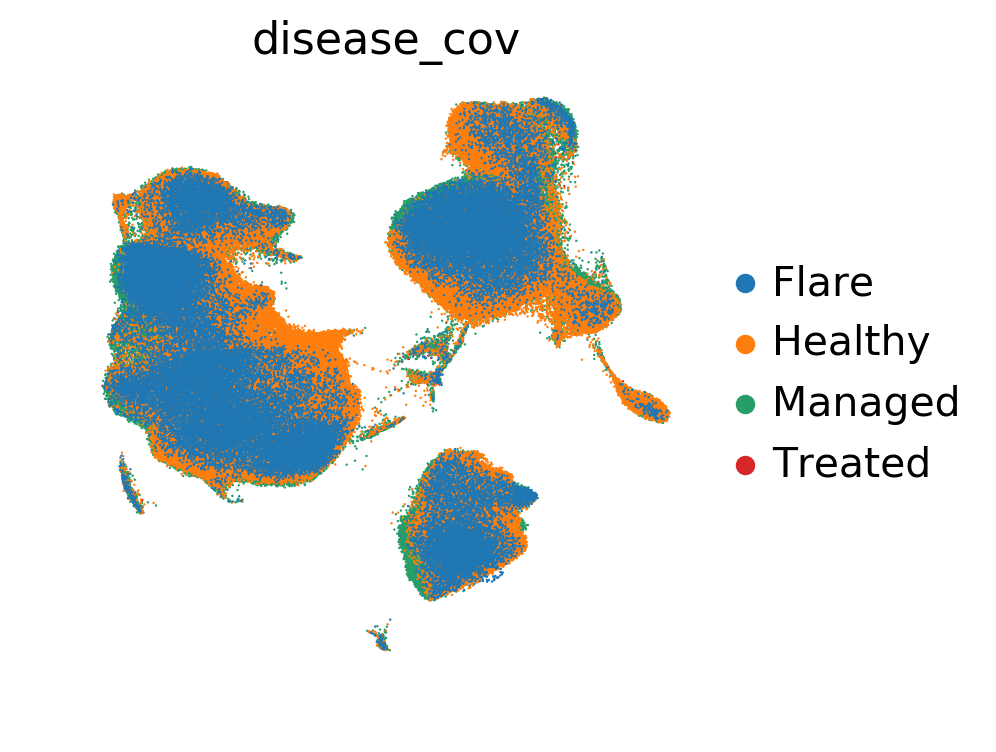

In [ ]:
disease_umap = sc.pl.umap(adata, color='disease_cov', size=3, show=True, edgecolor="none", palette=sc.pl.palettes.vega_20_scanpy, save='.disease.png')

computing density on 'umap'
saving figure to file ./figures./umap_density_disease_cov_umap_density_disease_cov.png


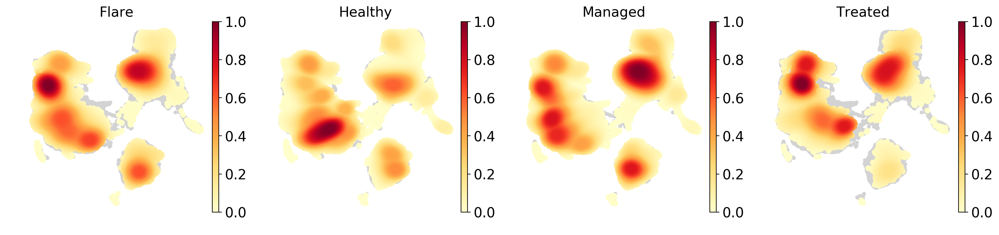

In [5]:
sc.tl.embedding_density(adata, basis='umap', groupby='disease_cov')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_disease_cov', show=True,  save='umap_density_disease_cov.png')

saving figure to file ./figures./umap.batch.png


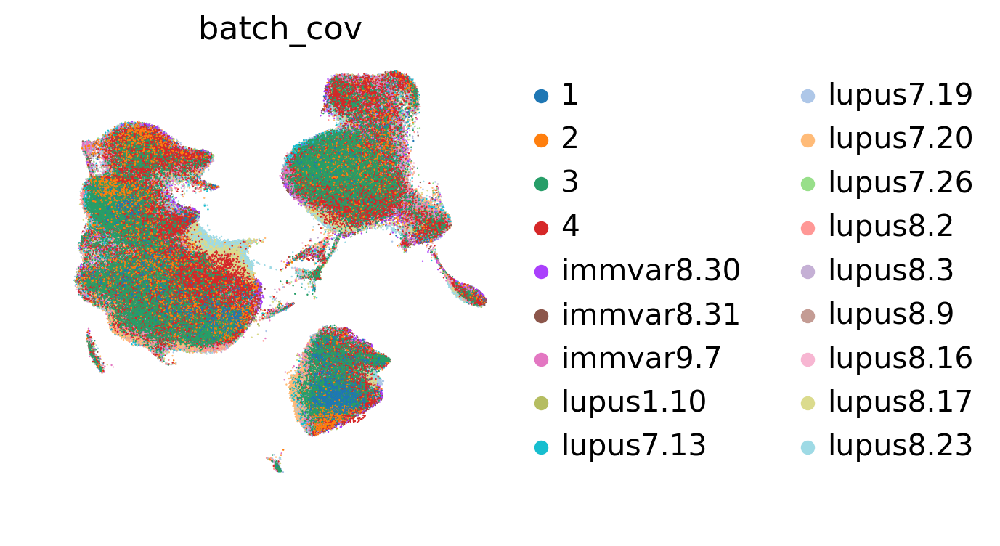

In [6]:
disease_umap = sc.pl.umap(adata, color='batch_cov', size=3,show=True, edgecolor="none", palette=sc.pl.palettes.vega_20_scanpy, save='.batch.png')

## Now, let's make a plot for each of the 16 people in batch 1 as a demo of variability

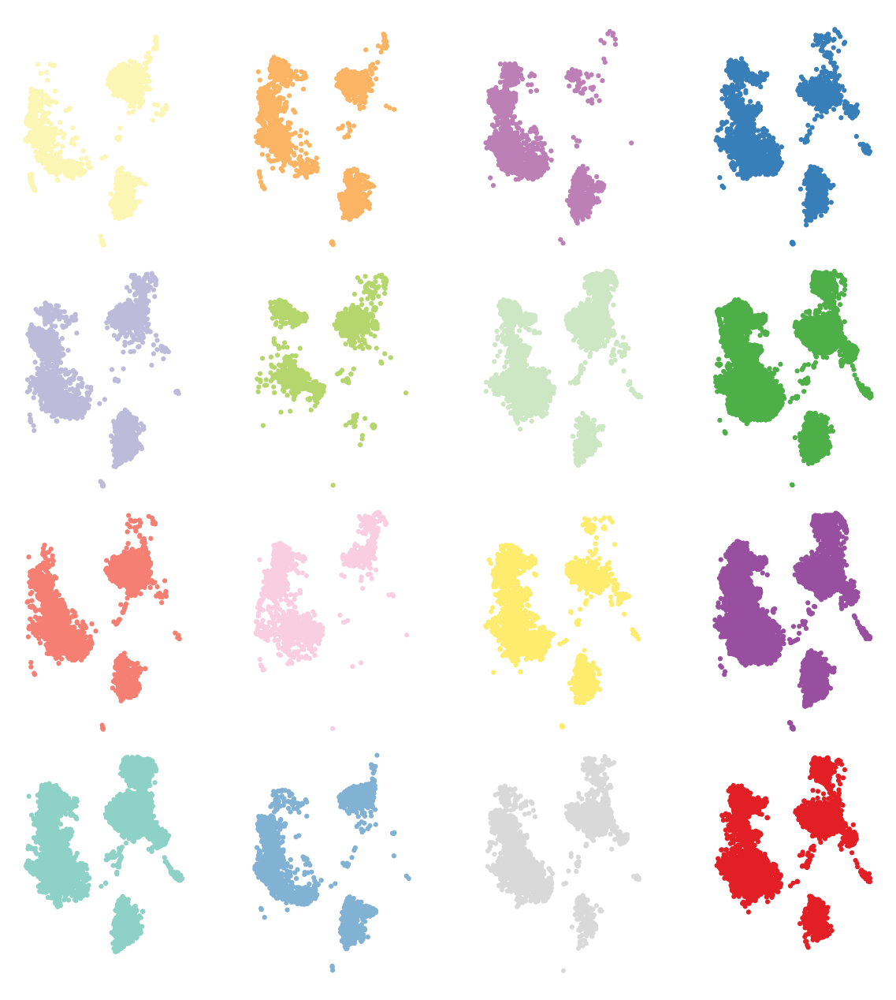

In [7]:
# Plot 16 plots for the individuals.
colors = ["#8ED1C6","#FCF6B5", "#BEBAD9", "#F47F72", "#81B1D3", "#FBB463", "#B4D66C", "#F9CEE1", "#DAD9D9", "#BC80B7", "#CDE6C4", "#FEEC6E", "#E31F26", "#387EB9", "#4EAF49", "#984F9F", "#8ED1C6","#FCF6B5", "#BEBAD9"];
fig,ax = plt.subplots(nrows=4,ncols=4, figsize=(7,7),sharex=True, sharey=True)
fig.tight_layout()
plt.subplots_adjust(wspace=-0.1, hspace=0)

batch_name = adata.obs.batch_cov.unique()[0]
batch = adata.obs.ind_cov_disease_cov[adata.obs.batch_cov==batch_name].unique();
batch = np.sort(batch.categories.values)
for ind_i in list(range(16)):
    ind = batch[ind_i]
    col = colors[ind_i]
    sc.pl.umap(adata[adata.obs.ind_cov_disease_cov==ind,], color = "ind_cov_disease_cov", title=None, palette=[col,col], ax=ax[(ind_i-1)%4,math.floor(ind_i/4)], size=20, edgecolor="none")
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_xaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_yaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_legend().remove()
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_title("")
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_aspect("equal")

fig.savefig(figdir+'/'+batch_name+'.ind.png')

# Rank genes and plot leiden groups

In [1]:
#sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
#sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

saving figure to file ./figures./umap.leiden.png


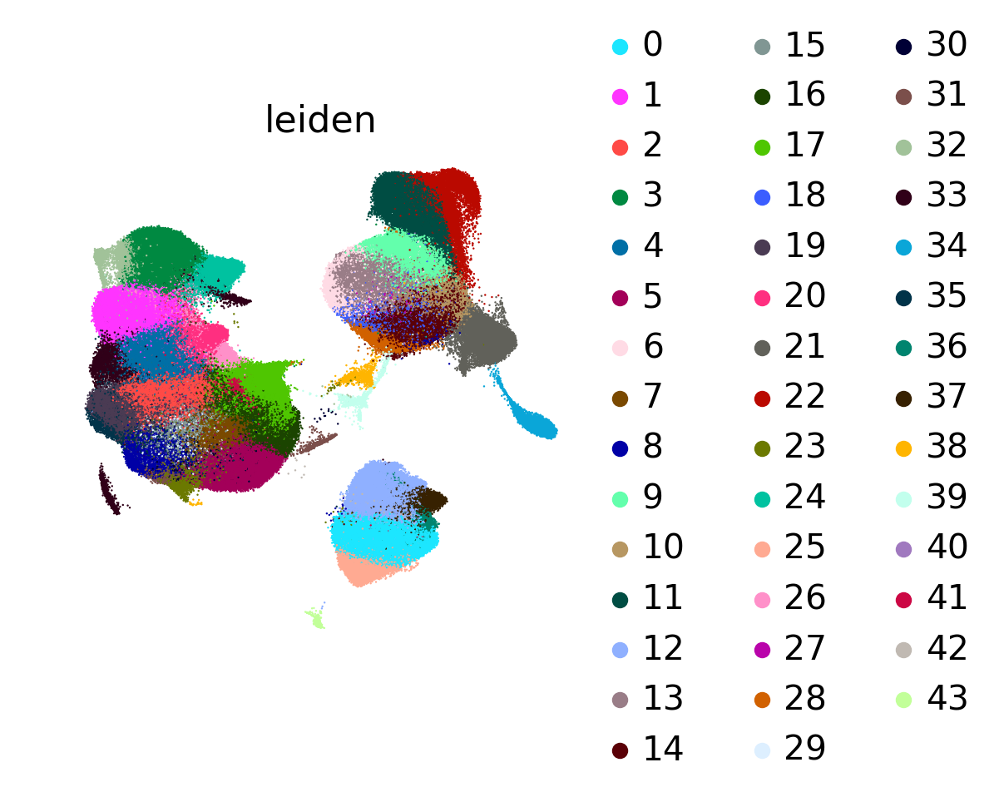

In [9]:
sc.pl.umap(adata, color='leiden', size=3, show=True, edgecolor="none", save='.leiden.png', palette=MASTERCOLORS)

# Most expressed genes per leiden group

In [11]:
pd.set_option('display.max_columns', None)
unique_leiden = np.unique(adata.obs['leiden'].values)
# Compile list of top genes
GeneRanks = pd.DataFrame()
for ii in range(len(unique_leiden)):
    GeneRanks[str('leiden_' + str(ii))] = adata.var_names[np.flipud(np.argsort(np.mean(adata.X[adata.obs['leiden'] == str(ii)], axis=0)))]
GeneRanks.to_csv('FLARE_top_expression.csv')
GeneRanks.head(20)

,leiden_0,leiden_1,leiden_2,leiden_3,leiden_4,leiden_5,leiden_6,leiden_7,leiden_8,leiden_9,leiden_10,leiden_11,leiden_12,leiden_13,leiden_14,leiden_15,leiden_16,leiden_17,leiden_18,leiden_19,leiden_20,leiden_21,leiden_22,leiden_23,leiden_24,leiden_25,leiden_26,leiden_27,leiden_28,leiden_29,leiden_30,leiden_31,leiden_32,leiden_33,leiden_34,leiden_35,leiden_36,leiden_37,leiden_38,leiden_39,leiden_40,leiden_41,leiden_42,leiden_43
0,CD79A,GZMH,TNFRSF4,KLRF1,GZMK,RP11-291B21.2,S100A12,FHIT,LTB,IFITM3,LGALS2,CDKN1C,RP5-887A10.1,S100A12,S100A12,TSHZ2,CD8B,RPS4Y1,SNORD3B-2,RTKN2,KLRB1,FCER1A,C1QA,RP11-367G6.3,XCL1,TCL1A,RPS4Y1,MIR4435-1HG,DDX3Y,C1orf56,HBA2,SOX4,HBA1,KIAA0101,LILRA4,USP18,EIF1AY,FCRL5,TYROBP,HBA2,SNORD3A,C1QA,CD79A,MZB1
1,TCL1A,CCL5,IL32,PRF1,CCL5,CD8B,IL8,CCR7,HLA-DQA1,LGALS2,CST3,FCGR3A,MS4A1,VCAN,VCAN,ADTRP,RP11-291B21.2,EIF1AY,SNORD3D,RP11-1399P15.1,GZMK,CLEC10A,C1QB,TSC22D1,XCL2,PPP1R14A,DDX3Y,LINC00152,EIF1AY,RP11-138A9.2,HBA1,CHI3L2,HBA2,MKI67,SERPINF1,IFI44L,RPS4Y1,MS4A1,FCN1,HBA1,SNORD3D,C1QB,TCL1A,TNFRSF17
2,MS4A1,NKG7,LTB,SPON2,DUSP2,S100B,VCAN,LTB,CCR7,TYMP,MS4A6A,HES4,TNFRSF13B,FCN1,MNDA,FAM13A,LTB,DDX3Y,SNORD3A,IL2RA,SLC4A10,CD1C,FCGR3A,MYL9,KLRC1,RP11-164H13.1,EIF1AY,S100A12,RPS4Y1,TMEM120B,HBB,ITM2A,FGFBP2,TYMS,TPM2,IFIT3,DDX3Y,MPP6,CSTA,HBB,SNORD3B-2,LTB,MS4A1,IGJ
3,FCER2,FGFBP2,KLRB1,GZMB,LYAR,CD8A,CSTA,CD7,FCER1A,MNDA,TYROBP,MS4A7,BANK1,THBS1,CSTA,FHIT,CD7,TTTY15,SNORD3B-1,TIGIT,KLRG1,HLA-DQA1,MS4A7,ACRBP,GNLY,NEIL1,TTTY15,VCAN,UTY,RP11-138A9.1,LTB,PRSS57,PRF1,STMN1,SCT,MX1,CD79A,CD79A,CST3,SNCA,SNORD3B-1,CD79A,LTB,DERL3
4,CD79B,CST7,ITGB1,GNLY,IL32,CCR7,MNDA,PRKCQ-AS1,PLD4,FCN1,CTSS,RP11-290F20.3,CD79A,RNASE2,TYROBP,PRKCQ-AS1,CCR7,UTY,S100A12,ARID5B,CCL5,HLA-DQB1,HES4,CLU,KLRF1,VPREB3,CCL5,CSTA,TTTY15,AC016831.7,PRKCQ-AS1,SPINK2,NKG7,TK1,LRRC26,ISG15,MS4A1,CD19,MNDA,HBD,RNU12,MS4A1,FCER2,ITM2C
5,LINC00926,CD3D,RP11-403A21.2,CLIC3,CMC1,PASK,CD14,AK5,CD1C,CST3,CSTA,TCF7L2,AL928768.3,MNDA,CTSS,AP3M2,CD3D,CCR7,VCAN,ICA1,GZMA,CPVL,CDKN1C,PF4,SPTSSB,CD79A,NKG7,MNDA,CSTA,RP11-544A12.8,CD7,FHIT,GZMB,CENPF,PLD4,IFIT1,TTTY15,PPP1R14A,VCAN,BPGM,TMEM107,CCR7,LINC00926,IGLL5
6,VPREB3,IL32,GATA3,FGFBP2,GZMA,CD7,G0S2,CD247,STMN1,MS4A6A,FCN1,LST1,RALGPS2,CSTA,CST3,PASK,CTSW,LTB,CSTA,IKZF2,NCR3,HLA-DPB1,RP11-290F20.3,GP9,IL2RB,PCDH9,GZMH,TYROBP,TYROBP,LTB,CCR7,STMN1,CST7,NUSAP1,ITM2C,IFI6,BANK1,FCRLA,CTSS,HEMGN,PTCH2,BIRC3,CD3D,AL928768.3
7,PPAPDC1B,GZMA,RORA,KLRB1,CST7,PRKCQ-AS1,FCN1,TMIGD2,ITM2C,IFI6,AIF1,CKB,BLK,RP11-1143G9.4,FCN1,LTB,PRKCQ-AS1,CD7,MNDA,IL32,IL32,HLA-DPA1,TCF7L2,TMEM40,CMC1,FCRLA,GZMA,FCN1,VCAN,PRKCQ-AS1,TXK,HPGD,SPON2,PCNA,PPP1R14B,RSAD2,CD79B,FCRL2,FCER1G,S100A12,LTB,CD69,CD79B,HRASLS2
8,BANK1,GNLY,CD40LG,CD7,NKG7,TXK,RBP7,TXK,IGJ,FGL2,GPX1,LRRC25,AC079767.4,CST3,GPX1,SLC40A1,TXK,PRKCQ-AS1,TYROBP,LTB,DUSP2,HLA-DRB1,LST1,PPBP,CTSW,CD79B,CST7,CTSS,CTSS,APOBEC3D,CD3D,TMIGD2,GNLY,CLSPN,CLEC4C,HERC5,UTY,CLECL1,TYMP,VCAN,JUN,RALGPS2,CXCR4,CD38
9,CD22,CD8A,CD69,NKG7,CD3D,CTSW,TYROBP,GZMB,ID3,APOBEC3A,CPVL,IFITM3,LTB,SAP30,RP11-1143G9.4,CCR7,IL32,TXK,GPX1,RGS1,LYAR,LMNA,LYPD2,ITGA2B,TNFRSF18,MS4A1,UTY,GPX1,CD14,FHIT,RP11-277L2.4,SERPINE2,KLRF1,TOP2A,DERL3,XAF1,RALGPS2,HSPB1,LST1,CSTA,WDR74,TCL1A,PPAPDC1B,TNFRSF13B


# Label cell populations

In [15]:
adata.obs['ct_cov'] = adata.obs['ct_cov'].astype('object')
adata.obs['ct_cov'].loc[adata.obs.leiden == "0"] = "B Cells" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "1"] = "CD8+ T Cells" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "2"] = "CD4+ T Cells" ## good                                                                                     
adata.obs['ct_cov'].loc[adata.obs.leiden == "3"] = "Natural Killer Cells" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "4"] = "CD8+ T Cells" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "5"] = "CD8+ T Cells" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "6"] = "Classical Monocytes" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "7"] = "CD4+ T Cells" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "8"] = "CD4+ T Cells" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "9"] = "Classical Monocytes" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "10"] = "Classical Monocytes" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "11"] = "Nonclassical Monocytes" ## good                                                                                    
adata.obs['ct_cov'].loc[adata.obs.leiden == "12"] = "B Cells" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "13"] = "Classical Monocytes" ## good  Macro                                                                                 
adata.obs['ct_cov'].loc[adata.obs.leiden == "14"] = "Classical Monocytes" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "15"] = "CD4+ T Cells" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "16"] = "CD8+ T Cells" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "17"] = "CD4+ T Cells" ## good                                                                                  
adata.obs['ct_cov'].loc[adata.obs.leiden == "18"] = "Classical Monocytes" ## good                                                                              
adata.obs['ct_cov'].loc[adata.obs.leiden == "19"] = "CD4+ T Cells" ## good                                                                               
adata.obs['ct_cov'].loc[adata.obs.leiden == "20"] = "CD8+ T Cells" ## good                                                                                   
adata.obs['ct_cov'].loc[adata.obs.leiden == "21"] = "Classical Dendritic Cells" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "22"] = "Nonclassical Monocytes" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "23"] = "Megakaryocytes" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "24"] = "Natural Killer Cells" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "25"] = "B Cells" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "26"] = "CD8+ T Cells" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "27"] = "Classical Monocytes" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "28"] = "Classical Monocytes" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "29"] = "CD4+ T Cells" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "30"] = "Doublets" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "31"] = "CD4+ T Cells" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "32"] = "Natural Killer Cells" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "33"] = "Progenitor Cells" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "34"] = "Plasmacytoid Dendritic Cells" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "35"] = "CD4+ T Cells" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "36"] = "B Cells" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "37"] = "B Cells" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "38"] = "Megakaryocytes" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "39"] = "RBCs" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "40"] = "Doublets" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "41"] = "Doublets" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "42"] = "Doublets" ##
adata.obs['ct_cov'].loc[adata.obs.leiden == "43"] = "B Cells" ##
adata.obs['ct_cov'] = adata.obs.ct_cov.astype('category')

/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


... storing 'ct_group' as categorical


saving figure to file ./figures./umap.figure6a.png


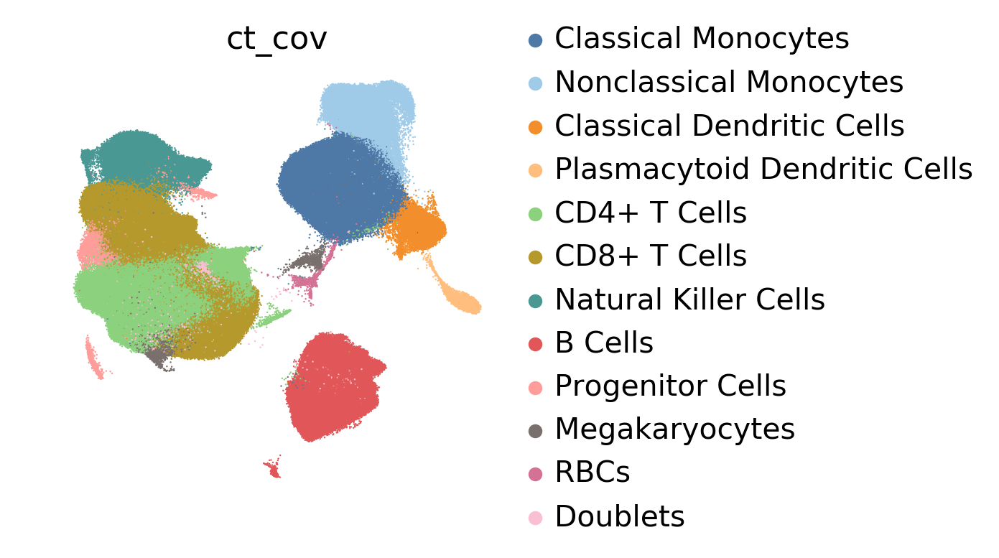

In [16]:
sc.settings.set_figure_params(dpi=100, dpi_save=300, format='png', frameon=False, transparent=True, fontsize=16)
plt.rcParams["image.aspect"] = "equal"
MasterORDER = ['Classical Monocytes','Nonclassical Monocytes', 'Classical Dendritic Cells', 'Plasmacytoid Dendritic Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'Natural Killer Cells', 'B Cells', 'Progenitor Cells', 'Megakaryocytes', 'RBCs', 'Doublets']
#colorrs = ["#E58606","#5D69B1","#52BCA3","#99C945","#CC61B0","#24796C","#DAA51B","#2F8AC4","#764E9F","#ED645A","#CC3A8E",'#BC23FF', '#D790FF']
colorrs = ["#4E79A7","#A0CBE8","#F28E2B","#FFBE7D","#8CD17D","#B6992D","#499894","#E15759","#FF9D9A","#79706E","#D37295","#FABFD2","#B07AA1","#D4A6C8","#9D7660",
                 "#E58606", "#5D69B1", "#24796C", '#DAA51B', '#000000', '#99C945', '#ED645A']

adata.obs['ct_cov'] = adata.obs['ct_cov'].cat.reorder_categories(MasterORDER)
adata.uns['ct_cov_colors'] = colorrs
celltype_umap = sc.pl.umap(adata, color='ct_cov', show=True, size=3, edgecolor="none" ,save='.figure6a.png')

# Proportions and Statistics

/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


as a proportion of total PBMC: Healthy vs. Managed WEIGHTED BY TOTAL PBMC COUNTS


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


,Beta,Cell,Pval
0,-11.532478883945279,Classical Monocytes,2.265855e-14
1,-2.193146596335544,Nonclassical Monocytes,1.381499e-06
2,0.23088088701180595,Classical Dendritic Cells,1.743821e-02
3,0.47873913015516895,Plasmacytoid Dendritic Cells,1.541170e-22
4,11.088862407573611,CD4+ T Cells,1.638457e-14
5,1.8326426368747175,CD8+ T Cells,1.493166e-01
6,0.3797841797629038,Natural Killer Cells,5.325457e-01
7,-0.06383159298762431,B Cells,9.554041e-01
8,-0.2818607253451766,Progenitor Cells,9.063298e-05
9,0.11146577668568969,Megakaryocytes,2.440948e-01


as a proportion of total PBMC: Healthy vs. Treated WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-10.784733715320963,Classical Monocytes,0.003016
1,-1.8918996055721768,Nonclassical Monocytes,0.028758
2,0.9376687215630626,Classical Dendritic Cells,0.000439
3,0.6577898479488422,Plasmacytoid Dendritic Cells,0.000525
4,6.2985231427317885,CD4+ T Cells,0.185595
5,1.0402113439016916,CD8+ T Cells,0.789609
6,-5.022237754294915,Natural Killer Cells,0.022233
7,7.225234204218513,B Cells,0.003493
8,-0.5236378969328637,Progenitor Cells,0.000311
9,0.8596709578482229,Megakaryocytes,0.022207


as a proportion of total PBMC: Healthy vs. Flare WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-6.206553308972525,Classical Monocytes,1.760970e-02
1,0.2172217719502451,Nonclassical Monocytes,6.959112e-01
2,0.9335997223643767,Classical Dendritic Cells,6.120784e-07
3,0.5964033662087947,Plasmacytoid Dendritic Cells,3.477790e-06
4,11.38373735387778,CD4+ T Cells,2.310415e-04
5,-6.378642332304992,CD8+ T Cells,9.807875e-03
6,0.24409090523115196,Natural Killer Cells,8.535571e-01
7,-0.7997210524024914,B Cells,6.765000e-01
8,-0.8822982999433687,Progenitor Cells,8.579102e-07
9,0.7113877969570751,Megakaryocytes,2.894384e-03


as a proportion of total PBMC: Treated vs. Flare WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,4.57818040634844,Classical Monocytes,0.553515
1,2.1091213775224227,Nonclassical Monocytes,0.072468
2,-0.004068999198685752,Classical Dendritic Cells,0.986298
3,-0.06138648174004807,Plasmacytoid Dendritic Cells,0.441761
4,5.085214211145986,CD4+ T Cells,0.169379
5,-7.418853676206683,CD8+ T Cells,0.132732
6,5.2663286595260725,Natural Killer Cells,0.082300
7,-8.02495525662101,B Cells,0.092687
8,-0.35866040301050406,Progenitor Cells,0.494588
9,-0.14828316089114818,Megakaryocytes,0.428520


as a proportion of total PBMC: Treated vs. Managed WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-0.7477451686243168,Classical Monocytes,0.886136
1,-0.3012469907633668,Nonclassical Monocytes,0.850980
2,-0.706787834551257,Classical Dendritic Cells,0.036172
3,-0.1790507177936734,Plasmacytoid Dendritic Cells,0.087421
4,4.790339264841824,CD4+ T Cells,0.235249
5,0.7924312929730255,CD8+ T Cells,0.855179
6,5.402021934057823,Natural Killer Cells,0.009661
7,-7.289065797206137,B Cells,0.092788
8,0.2417771715876877,Progenitor Cells,0.370970
9,-0.7482051811625334,Megakaryocytes,0.004898


as a proportion of total PBMC: Healthy vs. SLE WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-11.504899486583556,Classical Monocytes,4.749998e-14
1,-2.1820355777547404,Nonclassical Monocytes,9.893705e-07
2,0.256063528949289,Classical Dendritic Cells,7.953921e-03
3,0.48539428063397366,Plasmacytoid Dendritic Cells,6.569969e-24
4,10.912178323708938,CD4+ T Cells,1.674075e-14
5,1.8034150625247647,CD8+ T Cells,1.564337e-01
6,0.18053914853078643,Natural Killer Cells,7.753741e-01
7,0.17849337612720517,B Cells,8.741372e-01
8,-0.29077829374683173,Progenitor Cells,6.166561e-05
9,0.13906214088200775,Megakaryocytes,1.426321e-01


as a proportion of total PBMC: Healthy vs. Treated&Flare WEIGHTED BY TOTAL PBMC COUNTS


,Beta,Cell,Pval
0,-10.784733715320963,Classical Monocytes,0.003016
1,-1.8918996055721768,Nonclassical Monocytes,0.028758
2,0.9376687215630626,Classical Dendritic Cells,0.000439
3,0.6577898479488422,Plasmacytoid Dendritic Cells,0.000525
4,6.2985231427317885,CD4+ T Cells,0.185595
5,1.0402113439016916,CD8+ T Cells,0.789609
6,-5.022237754294915,Natural Killer Cells,0.022233
7,7.225234204218513,B Cells,0.003493
8,-0.5236378969328637,Progenitor Cells,0.000311
9,0.8596709578482229,Megakaryocytes,0.022207


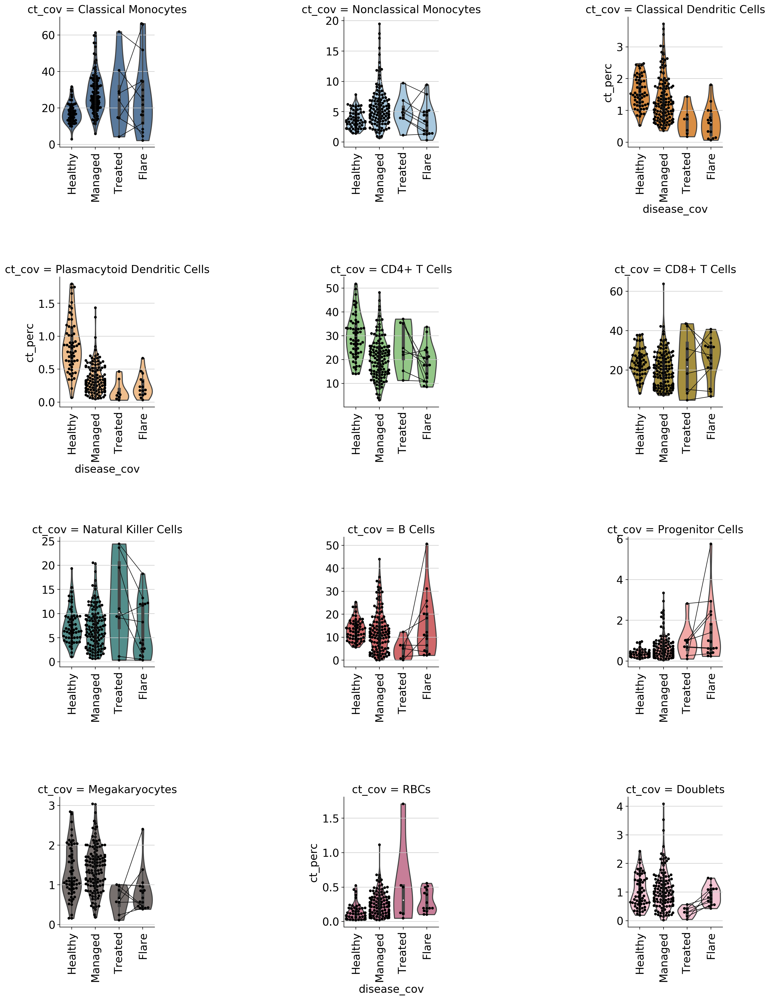

In [20]:
## Make proportion plots
adata_obs_small = adata.obs
ind_count = adata_obs_small.groupby(['ind_cov_disease_cov','ct_cov','disease_cov','pop_cov', 'ind_cov'])['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")
ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")
# Add weights to WLS
ind_perc['counts'] = ind_count.values.tolist()

ind_perc['ind_count_sum'] = list(np.zeros(len(ind_count.values.tolist()),dtype=int))
# Add total sums per individual to structure
for ii in range(len(ind_count_sums)):
    ind_perc['ind_count_sum'][ind_perc.ind_cov_disease_cov==ind_count_sums.ind_cov_disease_cov[ii]] = ind_count_sums.counts[ii]

# Filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov_disease_cov.isin(ind_count_sums.ind_cov_disease_cov[ind_count_sums.counts > 100])]

cg_cov = pd.DataFrame( {    'ct_cov':['Classical Monocytes','Nonclassical Monocytes', 'Classical Dendritic Cells', 'Plasmacytoid Dendritic Cells', 'CD4+ T Cells', 'CD8+ T Cells', 'Natural Killer Cells', 'B Cells', 'Progenitor Cells', 'Megakaryocytes', 'RBCs', 'Doublets'],
                          'ct_group':['mono',               'mono',                   'mono',                      'mono',                         'lymph',        'lymph',        'lymph',                'lymph',   'Progenitor',       'MK',             'RBCs',  'Doublets']})

# Add cell type macrogroup as observation
adata.obs['ct_group'] = adata.obs['ct_cov'].tolist()
celltypes = np.unique(cg_cov['ct_cov'].tolist())
for ii in range(len(celltypes)):
    adata.obs['ct_group'][adata.obs['ct_cov']==cg_cov['ct_cov'][ii]] = cg_cov['ct_group'][ii]

ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov_disease_cov = ind_count_sums.ind_cov_disease_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc.ind_cov_disease_cov = ind_perc.ind_cov_disease_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

perc_plot = sns.catplot(x='disease_cov', y='ct_perc', order=[ "Healthy", "Managed", "Treated", "Flare"], hue='ct_cov', data=ind_perc, kind='violin', col_order=MasterORDER, col='ct_cov', col_wrap=3, cut=0, dodge=False, aspect=1, sharex=False, sharey=False, palette=colorrs)

for ct_i in list(range(len(MasterORDER))):
    ct = MasterORDER[ct_i]
    sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], order=[ "Healthy", "Managed", "Treated", "Flare"], color="0", size=4, ax=perc_plot.axes[ct_i])
    try:
        sns.pointplot(x="disease_cov", y="ct_perc", hue="ind_cov", data=ind_perc[ind_perc.ct_cov == ct], order=[ "Healthy", "Managed", "Treated", "Flare"], color="0", scale=0.3, ax=perc_plot.axes[ct_i])
    except:
        continue
    perc_plot.axes[ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_xaxis().label.set_visible(False)
    perc_plot.axes[ct_i].get_legend().remove()
    perc_plot.set_xticklabels(rotation=90)
    perc_plot.fig.subplots_adjust(wspace=2, hspace = 1)
    
perc_plot.savefig(figdir+"/violin.ct_cov_figure6b.png")
perc_plot.savefig(figdir+"/violin.ct_cov_figure6b.pdf")

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Managed WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Managed'])]
HEALTHYMANAGED_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Managed"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    HEALTHYMANAGED_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Treated WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Treated'])]
HEALTHYTREATED_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Treated"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    HEALTHYTREATED_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Flare WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Flare'])]
HEALTHYFLARE_effect = {}
HEALTHYFLARE_FC = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Flare"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    HEALTHYFLARE_effect[ct] = effect
    HEALTHYFLARE_FC[ct] = math.log2(sum(est.params)/est.params[0])
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Treated vs. Flare WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Treated', 'Flare'])]
TREATEDFLARE_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Flare"] = 0
    disease.values[disease=="Treated"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    TREATEDFLARE_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Treated vs. Managed WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Treated', 'Managed'])]
TREATEDMANAGED_effect = {}
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="Managed"] = 0
    disease.values[disease=="Treated"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    TREATEDMANAGED_effect[ct] = effect
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. SLE WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Treated', 'Untreated', 'Managed'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease!="Healthy"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)

# Statistical tests...
print('as a proportion of total PBMC: Healthy vs. Treated&Flare WEIGHTED BY TOTAL PBMC COUNTS')
all_out = pd.DataFrame();
ind_perc0 = ind_perc[ind_perc.disease_cov.isin(['Healthy', 'Treated', 'Untreated'])]
for ct_i in list(range(len(ind_perc0.ct_cov.cat.categories))):
    ct = ind_perc0.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc0.ct_perc[ind_perc0.ct_cov==ct]
    weights = ind_perc0.ind_count_sum[ind_perc0.ct_cov==ct]
    disease = ind_perc0.disease_cov[ind_perc0.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease!="Healthy"] = 0
    disease.values[disease=="Healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    #est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
    all_out['Pval'] = all_out['Pval'].astype(float)
display(all_out)


In [14]:
def getproportions(celltype, group1, group2):
    print('{} proportion for celltype: {}: {}' .format(group1, celltype, ind_perc[ind_perc.disease_cov==group1][ind_perc.ct_cov==celltype].ct_perc.mean()))
    print('{} proportion for celltype: {}: {}' .format(group2, celltype, ind_perc[ind_perc.disease_cov==group2][ind_perc.ct_cov==celltype].ct_perc.mean()))

    
getproportions(celltype='Th',group1='Healthy', group2='Flare')

Healthy proportion for celltype: Th: 7.400027992029711
Flare proportion for celltype: Th: 10.641247502300688


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


# Feature plots for Untreated Treated pairs

In [22]:
%%capture
pairs = ['FLARE004', 'FLARE009', 'FLARE011', 'FLARE013', 'FLARE016', 'FLARE003', 'FLARE002', 'FLARE008']
colors = ["#000000", "#FF0000"]
for pair in pairs:
    bdata = adata[adata.obs['ind_cov']==pair]
    print(pair)
    sc.pl.umap(bdata, size=10, show=False, color='disease_cov', save=str('TREATED_UNTREATED_PAIR'+ pair + '.disease.png'), palette=colors)
    plt.show() 

... storing 'ct_group' as categorical
... storing 'ct_group' as categorical
... storing 'ct_group' as categorical
... storing 'ct_group' as categorical
... storing 'ct_group' as categorical
... storing 'ct_group' as categorical
... storing 'ct_group' as categorical
... storing 'ct_group' as categorical


# Map colors onto cell type labels

In [ ]:
colormapping = dict()
unique_ct = adata.obs.ct_cov.cat.categories.tolist()
for ii in range(len(unique_ct)):
    colormapping[unique_ct[ii]] = adata.uns['ct_cov_colors'][ii]

In [5]:
# Atypical memory B cells
sc.pl.umap(adata, color=['CR2', 'CD27', 'FCRL5', 'ITGAX', 'NKG7'], show=True, save='.AtypicalBgenes.png')

saving figure to file ./figures./umap.CD163_expression.png


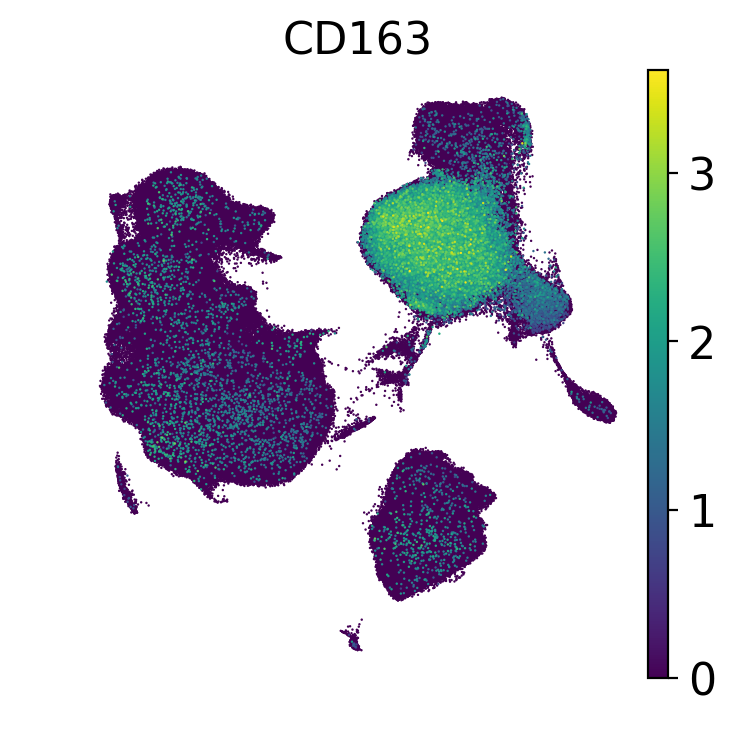

In [32]:
# Macro
sc.pl.umap(adata, color='CD163', size=3, show=True, edgecolor="none", save='.CD163_expression.png')

saving figure to file ./figures./umap.platelet.png


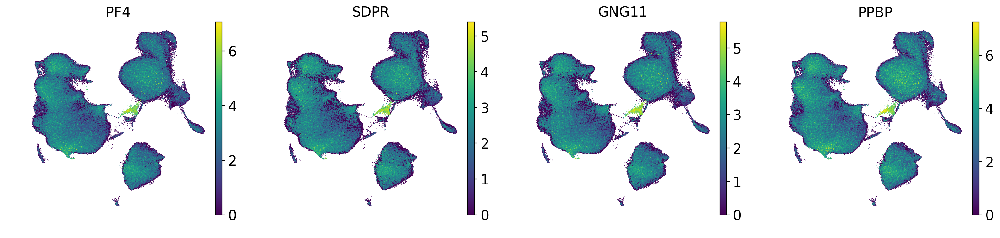

In [35]:
## platelet effect
sc.pl.umap(adata, color=["PF4", "SDPR", "GNG11", "PPBP"], size=3, show=True, save='.platelet.png')

saving figure to file ./figures./umap.cycling.png


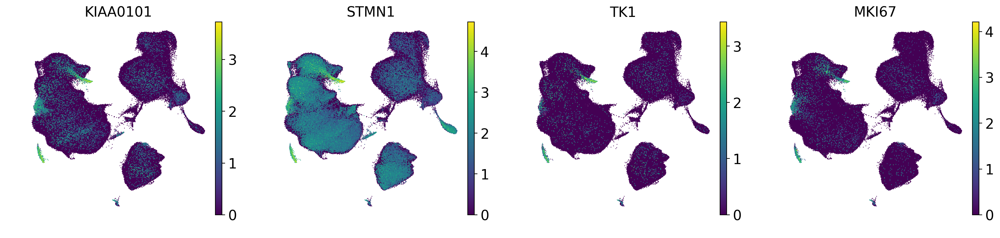

In [36]:
## cycling
sc.pl.umap(adata, color=["KIAA0101","STMN1","TK1","MKI67"], size=3, show=True, save='.cycling.png')

saving figure to file ./figures./umap.MACRO.png


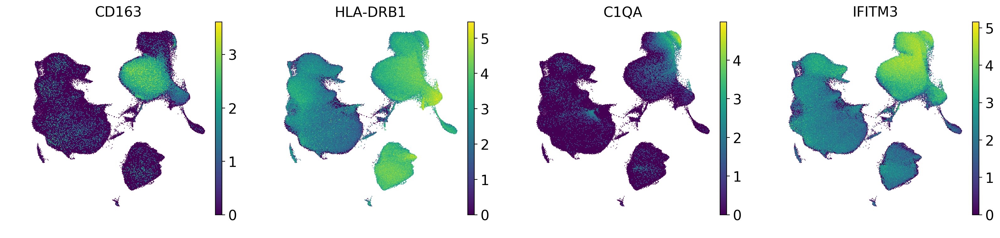

In [37]:
## MACROPHAGES
sc.pl.umap(adata, color=['CD163', 'HLA-DRB1', 'C1QA', 'IFITM3'], size=3, show=True, save=".MACRO.png")

In [4]:
## CD4, CD8 and NK axis
sc.pl.umap(adata, color=["CD3D","CD8A","CD4","NCAM1", "FCGR3A", 'NKG7', 'IFNG', 'GZMB', 'PRF1'],size=3, show=True, save=".TNK.png")
# Two NK sub populations: CD56high/lowCD16high/low, CD56lowCD16high
# https://www.frontiersin.org/files/Articles/162361/fimmu-06-00567-HTML/image_m/fimmu-06-00567-g001.jpg

In [23]:
#sc.pl.violin(adata, keys= ['GZMB', 'PRF1', 'SH2D1A', 'ICAM1','CD86', 'RAB27A', 'UNC13D', 'FHL3', 'FHL2'], groupby='disease_cov', show=False, use_raw=False, save='.T8emcyto1expression')
#sc.pl.stacked_violin(adata, keys= ['GZMB', 'PRF1', 'SH2D1A', 'ICAM1','CD86', 'RAB27A', 'UNC13D', 'FHL3', 'FHL2'], groupby='disease_cov', show=False, use_raw=False, save='.T8emcyto1expression')
sc.pl.umap(adata, color=['GZMB', 'PRF1', 'SH2D1A', 'ICAM1','CD86', 'RAB27A', 'UNC13D', 'FHL3', 'FHL2'],size=3, show=False, use_raw=True, save=".gzmbgenes.png")
sc.pl.violin(adata, keys= ['GZMB', 'PRF1', 'SH2D1A', 'ICAM1','CD86', 'RAB27A', 'UNC13D', 'FHL3', 'FHL2'], groupby='disease_cov', show=False, use_raw=True, save='.T8emcyto1expression_raw')
#sc.pl.stacked_violin(adata, var_names= ['GZMB', 'PRF1', 'SH2D1A', 'ICAM1','CD86', 'RAB27A', 'UNC13D', 'FHL3', 'FHL2'], groupby='disease_cov', show=False, use_raw=True, save='.T8emcyto1expression_raw')


... storing 'ct_group' as categorical


saving figure to file ./figures./umap.gzmbgenes.png
saving figure to file ./figures./violin.T8emcyto1expression_raw.png


In [3]:
## Memory vs. helper vs. naive
sc.pl.umap(adata, color=["CCR7","IL7R","S100A4","CD58", 'FAS', 'IL2RA'],show=True, size=3, save=".TMemThTNaive.png")

saving figure to file ./figures./umap.TREG.png


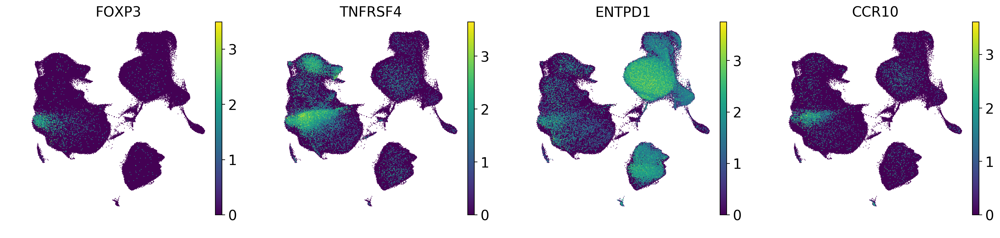

In [24]:
## treg
sc.pl.umap(adata, color=["FOXP3","TNFRSF4","ENTPD1","CCR10"],size=3, show=True, save=".TREG.png")

saving figure to file ./figures./umap.Y.png


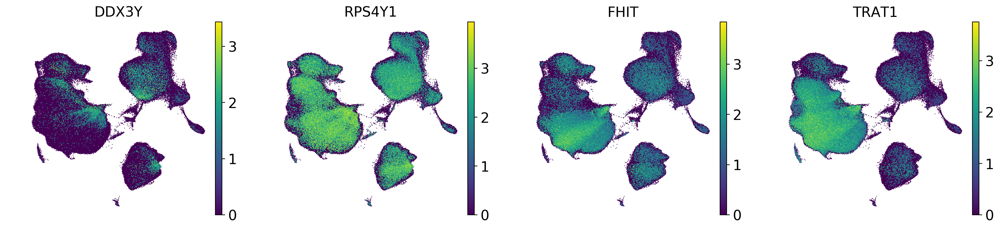

In [25]:
## y chromosome gender effect
sc.pl.umap(adata, color=["DDX3Y", "RPS4Y1", "FHIT","TRAT1"], size =3, show=True, save=".Y.png")

In [26]:
## b cells, plasmablasts and pdcs
sc.pl.umap(adata, color=["MZB1", "IGJ", "CD79A", 'CD27', 'FCRL5', 'IL6', 'FCRLA', 'FCRL3'],size=3, show=True, save=".B.png")

KeyboardInterrupt: 

<Figure size 1932x800 with 0 Axes>

In [2]:
sc.pl.umap(adata, color=['ITGAM', 'CD33', 'FUT4', 'HLA-DRA', 'CD14', 'CD163'],size=3, show=False, save=".B.png")

NameError: name 'sc' is not defined